# Assignment 03

Joel Brigida

CAP4613-001 Intro to Deep Learning

Prof. Behnaz Ghoraani

Due Date: Feb 20, 2022

## Problem # 1: Perceptron Learning

Consider the following set of data points:

<div align="center">

| Input <br> $x_1, \ x_2$| Desired Label |
| :-: | :-: |
| $1,\ 0$ | $1$ |
| $0,\ 1$ | $1$ |
| $-1,\ 0$ | $0$ |
| $-1,\ 1$ | $0$ |
| $0,\ -1$ | $0$ |

</div>

As the above table shows, the data points are categorized (labeled) in two groups specified by the labels `1` and `0`.

### a) Use the perceptron learning rule to train a single neuron perceptron in the data points given above. Show all steps in the iteration.

Initialize the weights to ($w_0 = -0.7, \ w_1 = -0.2, \ w_2 = 0.95$)

Assume the learning rate is 1 (i.e. $\eta  = 1$)

Use the hard-limiter activation function (If $v \ge 0 \ \mathrm{output} \ 1, \mathrm{otherwise \ output}\ 0$ )

i.e.: 
$$ \varphi(v) = \begin{cases} 
          1, & \mathrm{if} \ v\ge 0 \\
          0, & \mathrm{if} \ v < 0 
       \end{cases}
$$


### b) Draw the schematics of the learned perceptron labeling the learned weights.

### c) Provide the equation of the trained model (i.e. the classifier line).

### d) Plot the given data points with _two_ different markers for each group.

### e) Plot the classifier line to the plot in (d).

### f) Using the trained perceptron, classify the test data points given in the table below. Show your work for each data point and provide the predicted labels ($0$ or $1$) in a table like below:

<div align="center">

| Input<br>$x_1, \ x_2$ | Desired Label | Predicted Label |
| :-: | :-: | :-: |
| $2, \ 2$ | $1$ | $1$ |
| $-2, \ -2$ | $0$ | $0$ |
| $0, \ 0$ | $0$ | $1$ |
| $-2, \ 0$ | $0$ | $0$ |

</div>

### g) Provide the Confusion Matrix for part (f) and calculate the accuracy. Consider `Class 1` as the positive class.

In [1]:
# Import Libraries
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
def img_plt(img):
    plt.figure(figsize=(45, 40))
    plt.tight_layout()
    #plt.suptitle('Problem #1', fontsize=32)
    plt.tight_layout()
    for i in range(1, 7):
        plt.subplot(2, 3, i)
        plt.imshow(img[i - 1], cmap = 'gray')
        plt.title('Page: ' + str(i), fontsize=32)
    plt.show()

In [3]:
image_filenames = ['./assets/HW3/HW3-1.jpg', './assets/HW3/HW3-2.jpg', './assets/HW3/HW3-3.jpg', 
                   './assets/HW3/HW3-4.jpg', './assets/HW3/HW3-5.jpg', './assets/HW3/HW3-6.jpg']

# create a numpy array of images for printing
image_arrays = []
for filename in image_filenames:
    image = Image.open(filename)
    image_array = np.array(image)
    image_arrays.append(image_array)

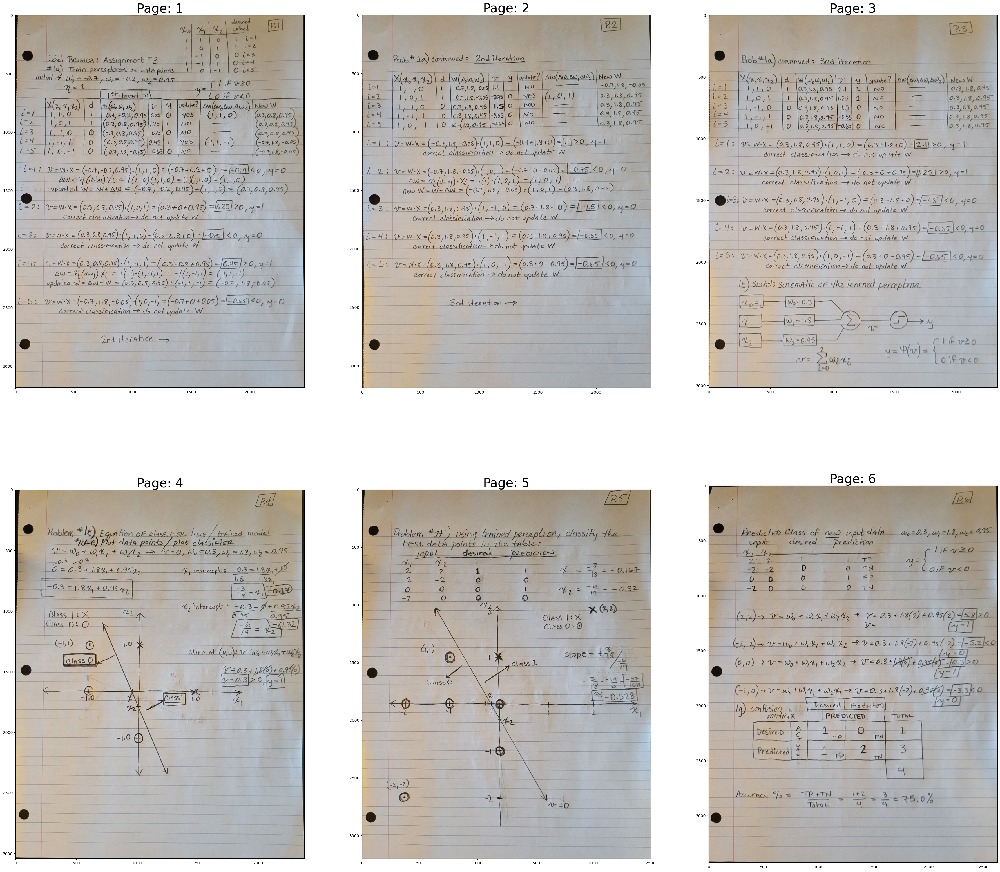

In [4]:
img_plt(image_arrays)

## Problem 2: Perceptron Learning in Python

### a) Create class `NeuralNetwork():` that creates a single neuron, train it, and test it. This class should have the following function:
- i.  `def __init__(self):` that initializes a 3x1 weight vector randomly and initializes the learning rate to 1.<br><br>
- ii. `def hard_limiter(self, x):` that performs the hard limiter activation on the `nx1` vector `x`<br><br>
- iii. `def forward_propagation(self, inputs):` that performs the forward propagation by multiplying the inputs by the neuron weights and passing the output through the `hard_limiter` activation function.<br><br>
- iv. `def train(self, inputs, labels, num_train_iterations=10):` that performs the perceptron learning rule for `num_train_iterations` times using the inputs and labels.<br><br>
- v. `def pred(self,inputs):` classifies the inputs to either class 0 or 1 by multiplying them by the neuron weights, passing the output through the hard_limiter activation function and thresholding.<br><br>

### b) Use the perceptron learning rule to train a single neuron on the data points given in problem 2:
- i. Create an `np.array` of shape `5x2` that contains the inputs, and create another array with the shape of `5x1` that contains the labels.<br><br>
- ii. Add the bias to the input array to have a `5x3` shape.<br><br>
- iii. Create the network with one perceptron using the class NeuralNetwork(), then train it using train(inputs, labels,100 function.<br><br>

### c) Plot the given data points with two different markers for each group.

### d) Using the trained perceptron weight, plot the classifier line in the same plot in (c).

### Plot Functions:

In [5]:
# plot data points
def plot_fun(features, labels, classes):
    plt.plot(features[labels[:] == classes[0], 0], features[labels[:] == classes[0], 1], 'rs',
        features[labels[:] == classes[1], 0], features[labels[:] == classes[1], 1], 'g^')
    plt.axis([-2, 2, -2, 2])
    plt.title('Raw Data Plot For Both Classes')
    plt.xlabel('X_1: Feature 1')
    plt.ylabel('X_2: Feature 2')
    plt.legend(['Class ' + str(classes[0]), 'Class ' + str(classes[1])])
    plt.show()

# plot separating line: w1x1 + w2x2 + w0 = 0
def plot_fun_thr(features, labels, thresholdParams, classes = [0, 1]):
    # plot data points
    plt.plot(features[labels[:] == classes[0], 0], features[labels[:] == classes[0], 1], 'rs',
        features[labels[:] == classes[1], 0], features[labels[:] == classes[1], 1], 'g^')
    plt.axis([-2, 2, -2, 2])
    # plot separating line
    x1 = np.linspace(-2, 2, 50)
    # w1x1 + w2x2 + w0 = 0 => x2 = -(w1x1 + w0) / w2
    x2 = -(thresholdParams[1] * x1 + thresholdParams[0]) / thresholdParams[2]
    plt.plot(x1, x2, '-b')
    plt.title('Training Data With Classification Line')
    plt.xlabel('X_1: Feature 1')
    plt.ylabel('X_2: Feature 2')
    plt.legend(['Class ' + str(classes[0]), 'Class ' + str(classes[1])])
    plt.show()

### $$ \mathrm{Forward \ Propagation:} \ \sum_{i = 0}^{m} w_i x_i = v = \vec{w} \cdot \vec{x} $$
$$
\mathrm{Prediction:} \ \varphi(v) = \begin{cases} 
          1, & \mathrm{if} \ v\ge 0 \\
          0, & \mathrm{if} \ v < 0 
       \end{cases}
$$
$$
\mathrm{Train:} \ \Delta w = \eta(d_i - y_i)X_i \ \Longrightarrow \ w' = \Delta w + w
$$

#### $$ w_1x_1 + w_2x_2 + w_0 = 0 \ \Longrightarrow \ x_2 = \frac{-(w_1x_1 + w_0)}{w_2}$$

### Class Functions:

In [6]:
class NeuralNetwork(object):

    def __init__(self, num_params=2):
        # Use seed to generate same weights each run
        # np.random.seed(1)
        # 3x1 Weight Matrix
        self.weight_matrix = 2 * np.random.random((num_params + 1, 1)) - 1 # random weights between -1 and 1
        # Learning Rate: 'eta'
        self.l_rate = 0.6

    # Hard Limiter as activation function (label data)
    def hard_limiter(self, x):
        outs = np.zeros(x.shape)
        outs[x >= 0] = 1 # iterate and determine class of each item
        return outs # Return Classified Data

    # forward propagation (calculate local field: v = w0 + w1x1 + w2x2 + ... + wmxm)
    def forward_propagation(self, inputs):
        # inputs: 1 x 3, weight_matrix: 3 x 1
        outs = np.dot(inputs, self.weight_matrix)
        return self.hard_limiter(outs)

    # Training Neural Network
    def train(self, train_inputs, train_outputs, num_train_iterations = 1000):
        # Number of iterations to perform in this input dataset
        print("Classification Line Based on Initial Weights:")
        plot_fun_thr(train_inputs[:, 1:3], train_outputs, self.weight_matrix[:, 0]) #, classes) <= OPTIONAL
        for iteration in range(num_train_iterations): # Adjust weights for all inputs
            # Update the Perceptron based on misclassified examples
            for i in range(train_inputs.shape[0]):
                pred_i = self.pred(train_inputs[i, :])
                if pred_i != train_outputs[i]: # if misclassified data point (train outputs = d)
                    output = self.forward_propagation(train_inputs[i, :]) # output = y
                    # Calculate the error in the output
                    error = train_outputs[i] - output 
                    adjustment = self.l_rate * error * train_inputs[i] # adjustment = delta W
                    # Adjust the weight matrix
                    self.weight_matrix[:, 0] += adjustment
                    # Plot the separating line based on weights
            print('Training Iteration #' + str(iteration + 1))
            # Plot classifier lines
            plot_fun_thr(train_inputs[:, 1:3], train_outputs, self.weight_matrix[:, 0]) #, classes) <= OPTIONAL

    # predict classes of new data points (based on model)
    def pred(self, inputs):
        preds = self.forward_propagation(inputs)
        return preds

### Inputs from Problem #1:

Features Vector Before Bias:
[[ 1  0]
 [ 0  1]
 [-1  0]
 [-1  1]
 [ 0 -1]] 

Labels for each Feature:
[1 1 0 0 0] 



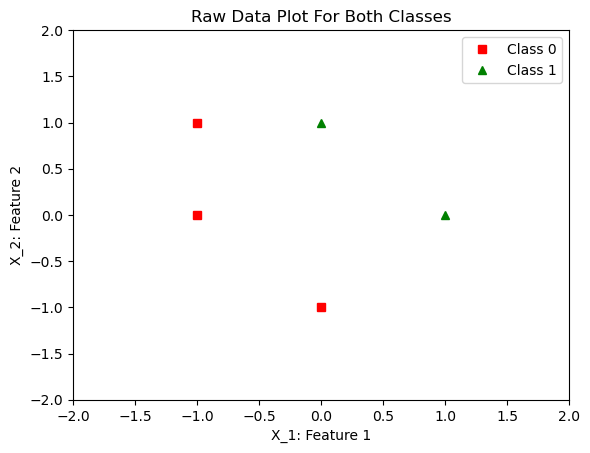

In [7]:
features = np.array([[1, 0], [0, 1], [-1, 0], [-1, 1], [0, -1]])
print('Features Vector Before Bias:')
print(features, '\n')

# Labels (desired outputs) for Logic AND function
labels = np.array([1, 1, 0, 0, 0])
print('Labels for each Feature:')
print(labels, '\n')

classes = [0, 1]
plot_fun(features, labels, classes)

### Create Vector/Matrix For Bias = 1

In [8]:
bias = np.ones((features.shape[0], 1))

print(bias, '\n')
print(bias.shape, '\n')
# Append the previous features vector to the bias vector
features = np.append(bias, features, axis = 1) # Axis 1 = Columns

print('Features Vector After Adding Bias:')
print(features, '\n')
print(features.shape)

[[1.]
 [1.]
 [1.]
 [1.]
 [1.]] 

(5, 1) 

Features Vector After Adding Bias:
[[ 1.  1.  0.]
 [ 1.  0.  1.]
 [ 1. -1.  0.]
 [ 1. -1.  1.]
 [ 1.  0. -1.]] 

(5, 3)


### Initialize Object & Weights:

In [9]:
neural_network = NeuralNetwork() # 2 feature parameters (default)

print('Random Weights Before Training:')
print(neural_network.weight_matrix)

Random Weights Before Training:
[[-0.98889087]
 [-0.15309963]
 [ 0.35381718]]


### Train the model:

Classification Line Based on Initial Weights:


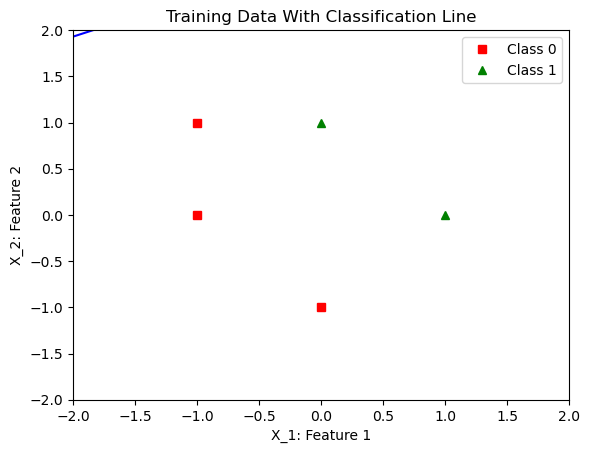

Training Iteration #1


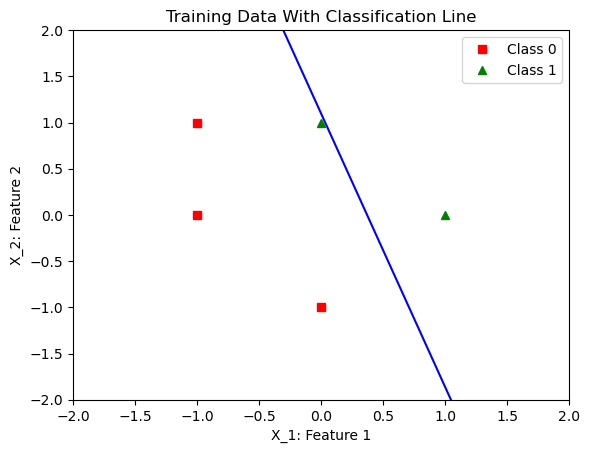

Training Iteration #2


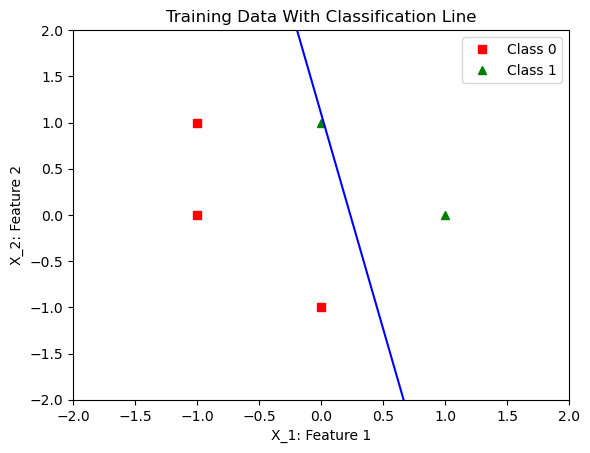

Training Iteration #3


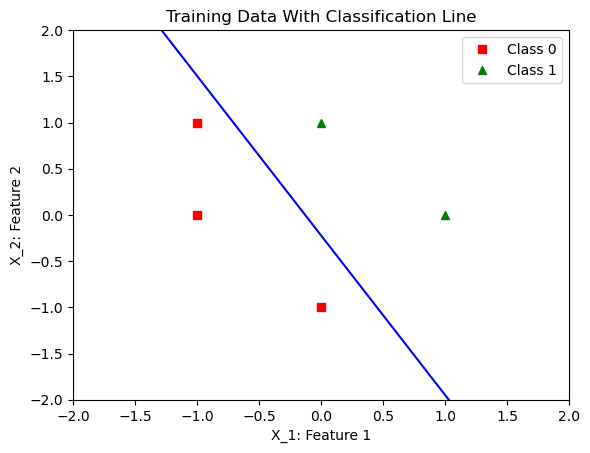

Training Iteration #4


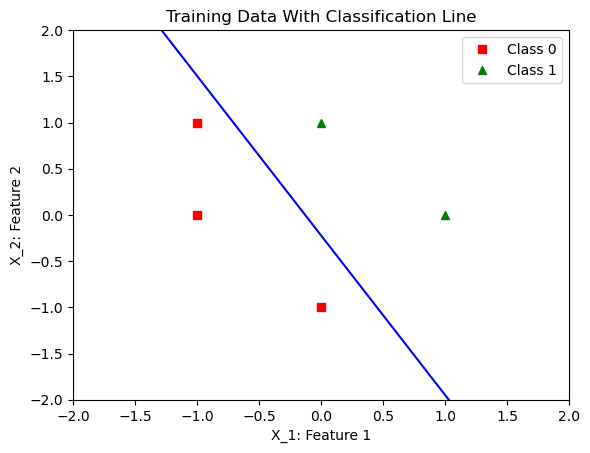

Training Iteration #5


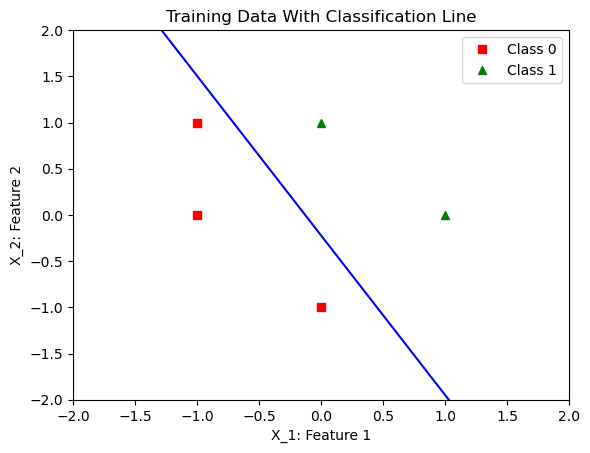

Training Iteration #6


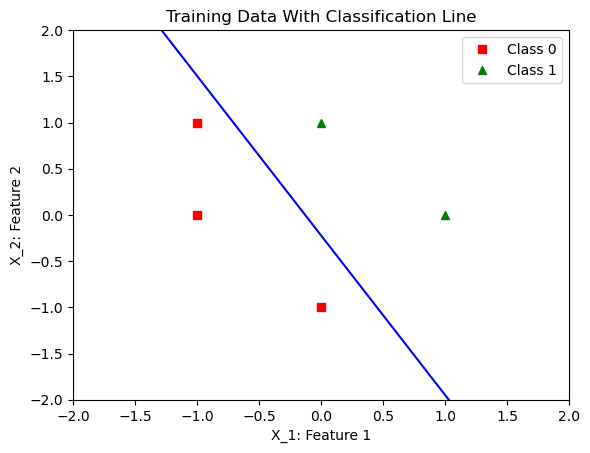

Training Iteration #7


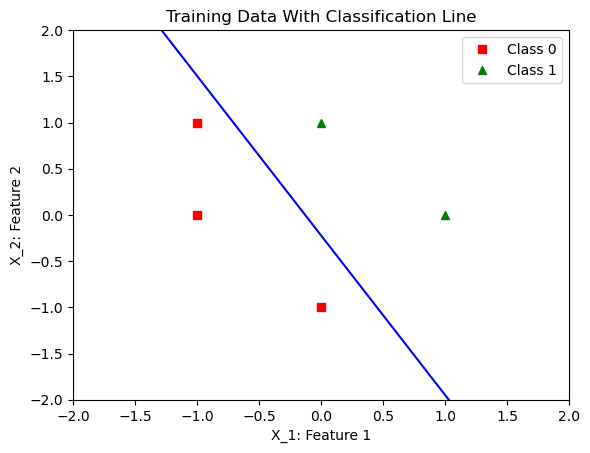

Training Iteration #8


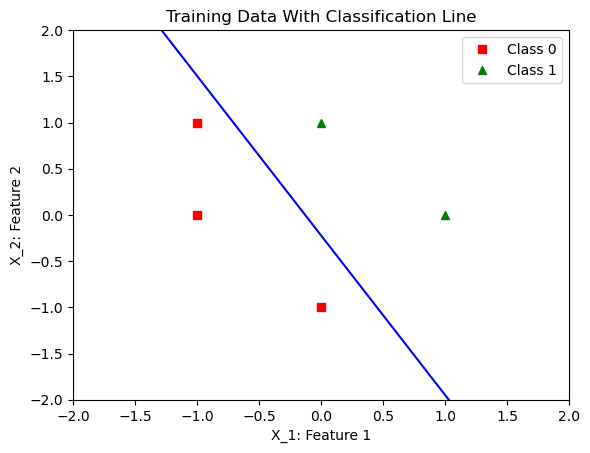

Training Iteration #9


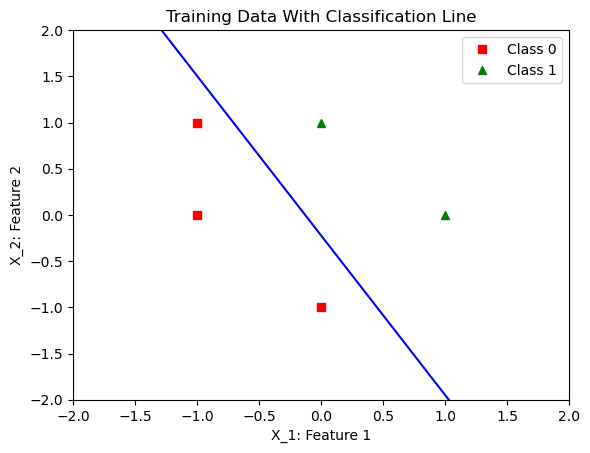

Training Iteration #10


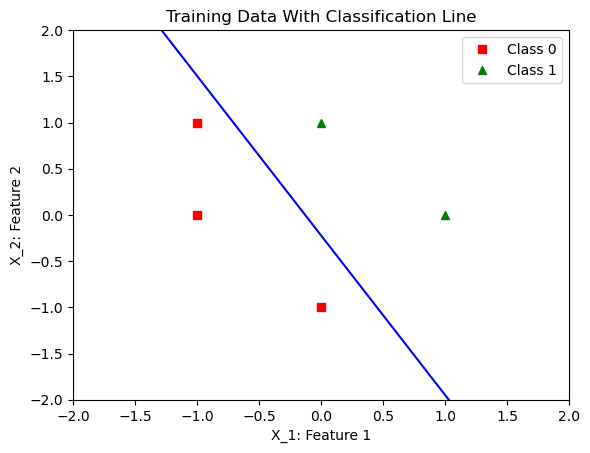

New Weights After Training
[[0.21110913]
 [1.64690037]
 [0.95381718]]


In [10]:
numIterations = 10
neural_network.train(features, labels, numIterations)

print('New Weights After Training')
print(neural_network.weight_matrix)

### Classify Data Points from Problem #1:

In [11]:
# Test neural network with training data points:
print('Testing network on training data points:')
print(neural_network.pred(features), '\n')

# define list for new data to classify
testArray = [[1, 2, 2], [1, -2, -2], [1, 0, 0], [1, -2, 0]]
#print(testArray)

# Test neural network with new data points
print('New Predictions for New Data Points:')
for (x, y, z) in testArray:
    #print (x, y, z)
    temp = (x, y, z)
    print(f'Predicted Class for {temp}: ', neural_network.pred(temp))

#print('Testing network on new examples:')
#print(neural_network.pred(np.array([1, 2, 2]))) # classify (2, 2)
#print(neural_network.pred(np.array([1, -2, -2]))) # classify (-2, -2)
#print(neural_network.pred(np.array([1, 0, 0]))) # classify (0, 0)
#print(neural_network.pred(np.array([1, -2, 0]))) # classify (-2, -0)

Testing network on training data points:
[[1.]
 [1.]
 [0.]
 [0.]
 [0.]] 

New Predictions for New Data Points:
Predicted Class for (1, 2, 2):  [1.]
Predicted Class for (1, -2, -2):  [0.]
Predicted Class for (1, 0, 0):  [1.]
Predicted Class for (1, -2, 0):  [0.]


### e) Using the trained perceptron, classify the test data samples given in the table below by calling the `pred()` function.

<div align="center">

| Input<br>$x_1, \ x_2$ | Desired Label | Predicted Label |
| :-: | :-: | :-: |
| $2,\ 2$ | $1$ | $1$ |
| $-2, -2$ | $0$ | $0$ |
| $0,\ 0$ | $0$ | $1$ |
| $-2,\ 0$ | $0$ | $0$ |

</div>